# Version information

In [2]:
from datetime import date
print("Running date:", date.today().strftime("%B %d, %Y"))
import pyleecan
print("Pyleecan version:" + pyleecan.__version__)
import SciDataTool
print("SciDataTool version:" + SciDataTool.__version__)

Running date: April 06, 2023
Pyleecan version:1.3.9
SciDataTool version:2.5.0


In [1]:
# %matplotlib inline

# Load the machine
from os.path import join
from pyleecan.Functions.load import load
from pyleecan.definitions import DATA_DIR

HDEV = load('D:\KDH\HDEV_nhole_nskew.json')
HDEV.plot()

(<Figure size 1600x1600 with 1 Axes>,
 <AxesSubplot:title={'center':'HDEV_nhole_nskew'}, xlabel='Position along x-axis [m]', ylabel='Position along y-axis [m]'>)

In [2]:
from os.path import join

from numpy import ones, pi, array, linspace, cos, sqrt

from pyleecan.Classes.Simu1 import Simu1
from pyleecan.Classes.InputCurrent import InputCurrent
from pyleecan.Classes.OPdq import OPdq
from pyleecan.Classes.MagFEMM import MagFEMM

# Create the Simulation
simu_femm = Simu1(name="HDEV_simulation", machine=HDEV)   
p = simu_femm.machine.stator.winding.p
qs = simu_femm.machine.stator.winding.qs

# Defining Simulation Input
simu_femm.input = InputCurrent()

# Rotor speed [rpm]
N0 = 3000 
simu_femm.input.OP = OPdq(N0=N0)

# time discretization [s]
time = linspace(start=0, stop=60/N0, num=32*p, endpoint=False) # 32*p timesteps
simu_femm.input.time = time 

# Angular discretization along the airgap circonference for flux density calculation
simu_femm.input.angle = linspace(start = 0, stop = 2*pi, num=1080, endpoint=False) # 2048 steps 

# Stator currents as a function of time, each column correspond to one phase [A]
I0_rms = 250/sqrt(2) 
felec = p * N0 /60 # [Hz]
rot_dir = simu_femm.machine.stator.comp_mmf_dir()
Phi0 = 140*pi/180  # Maximum Torque Per Amp

Ia = (
    I0_rms
    * sqrt(2)
    * cos(2 * pi * felec * time + 0 * rot_dir * 2 * pi / qs + Phi0)
)
Ib = (
    I0_rms
    * sqrt(2)
    * cos(2 * pi * felec * time + 1 * rot_dir * 2 * pi / qs + Phi0)
)
Ic = (
    I0_rms
    * sqrt(2)
    * cos(2 * pi * felec * time + 2 * rot_dir * 2 * pi / qs + Phi0)
)
simu_femm.input.Is = array([Ia, Ib, Ic]).transpose()

In [5]:
from pyleecan.Classes.MagFEMM import MagFEMM

simu_femm.mag = MagFEMM(
    type_BH_stator=0, # 0 to use the material B(H) curve, 
                      # 1 to use linear B(H) curve according to mur_lin,
                      # 2 to enforce infinite permeability (mur_lin =100000)
    type_BH_rotor=0,  # 0 to use the material B(H) curve, 
                      # 1 to use linear B(H) curve according to mur_lin,
                      # 2 to enforce infinite permeability (mur_lin =100000)
    file_name = "", # Name of the file to save the FEMM model
)

# Only the magnetic module is defined
simu_femm.elec = None
simu_femm.force = None
simu_femm.struct = None 

Pyleecan coupling with FEMM enables to define the machine with symmetry and with sliding band to optimize the computation time. The angular periodicity of the machine will be computed and (in the particular case) only 1/8 of the machine will be drawn (4 symmetries + antiperiodicity):

In [6]:
simu_femm.mag.is_periodicity_a=True

The same is done for time periodicity only half of one electrical period is calculated (i.e: 1/8 of mechanical period):

In [7]:
simu_femm.mag.is_periodicity_t=True

Pyleecan enable to parallelize the call to FEMM by simply setting:

In [8]:
simu_femm.mag.nb_worker = 4  # Number of FEMM instances to run at the same time (1 by default)

At the end of the simulation, the mesh and the solution can be saved in the **Output** object with:

In [9]:
simu_femm.mag.is_get_meshsolution = True # To get FEA mesh for latter post-procesing
simu_femm.mag.is_save_meshsolution_as_file = False # To save FEA results in a dat file

## Run simulation

In [10]:
180*6

1080

In [11]:
out_femm = simu_femm.run()

[11:35:35] Starting running simulation HDEV_simulation (machine=HDEV_nhole_nskew)
[11:35:35] Starting Magnetic module
[11:35:37] Computing Airgap Flux in FEMM
[11:35:54] End of simulation HDEV_simulation


When running the simulation, an FEMM window runs in background. You can open it to see pyleecan drawing the machine and defining the surfaces. 
![](https://www.pyleecan.org/_static/IPMSM_FEMM.png)
The simulation will compute 32*p/8 different timesteps by updating the current and the sliding band boundary condition. If the parallelization is activated (simu_femm.mag.nb_worker >1) then the time steps are computed out of order.

Once the simulation is finished, an Output object is return. The results are stored in the magnetic part of the output (i.e. _out_femm.mag_ ) and different plots can be called. This _out_femm.mag_ contains:   
- *Time*: magnetic time axis  
- *Angle*: magnetic position  
- *B*: airgap flux density (contains radial and tangential components)   
- *Tem*: electromagnetic torque   
- *Tem_av*: average electromagnetic torque
- *Tem_rip_pp* : Peak to Peak Torque ripple
- *Tem_rip_norm*: Peak to Peak Torque ripple normalized according to average torque   
- *Phi_wind_stator*: stator winding flux   
- *emf*: electromotive force  

Some of these properties are "Data objects" from the [SciDataTool](https://github.com/Eomys/SciDataTool) project. These object enables to handle unit conversion, interpolation, fft, periodicity... 

## Plot results
**Output** object embbed different plots to visualize results easily. A dedicated tutorial is available [here](https://www.pyleecan.org/tuto_Plots.html).

For instance, the radial and tangential magnetic flux in the airgap at a specific timestep can be plotted with:

In [49]:
# print(out_femm.mag.B)
# print(out_femm.mag.B.components['radial'])

from SciDataTool import Data1D, DataLinspace, DataPattern, DataTime, DataFreq, VectorField
a=DataTime.__init__
test=out_femm.mag.B.components['radial']
a,b,c=test.get_axes()
print(a)

parent = <class 'SciDataTool.Classes.DataTime.DataTime'> object
symbol = ""
name = "time"
unit = "s"
normalizations[elec_order] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	ref = 300.0
	


normalizations[mech_order] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	ref = 50.0
	


normalizations[angle_elec] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	ref = -0.0005305164769729845
	


normalizations[angle_rotor] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	slope = -18000.0
	offset = 30.000000000000004
	


initial = 0.0
final = 0.0015625
step = None
number = 16
include_endpoint = True
is_components = False
symmetries = {'antiperiod': 12}
is_overlay = False



c:\Users\KDH2018-PC\anaconda3\envs\py38_pyleecan139\lib\site-packages\SciDataTool\Functions\Plot\plot_2D.py:539: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


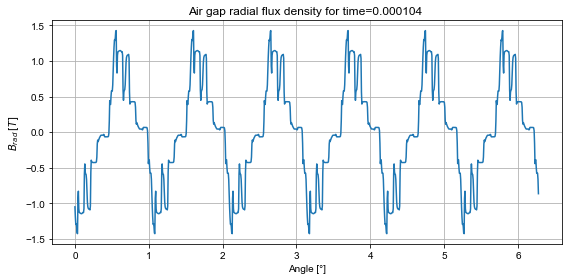

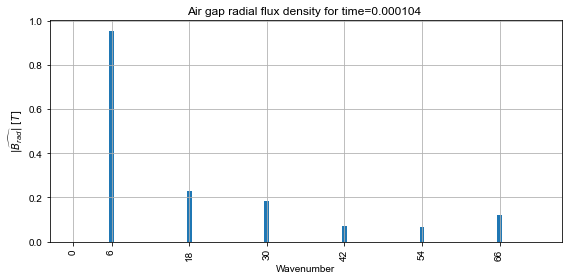

In [11]:
# Radial magnetic flux 
out_femm.mag.B.plot_2D_Data("angle","time[1]",component_list=["radial"])
out_femm.mag.B.plot_2D_Data("wavenumber=[0,76]","time[1]",component_list=["radial"])

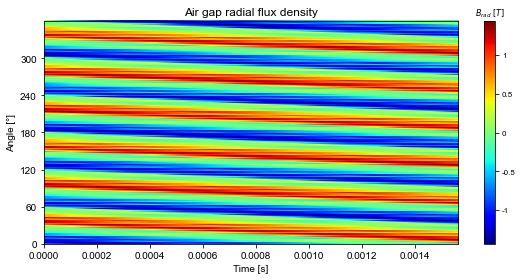

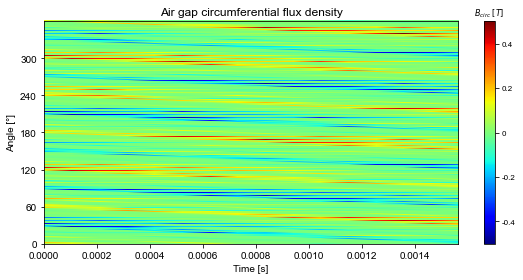

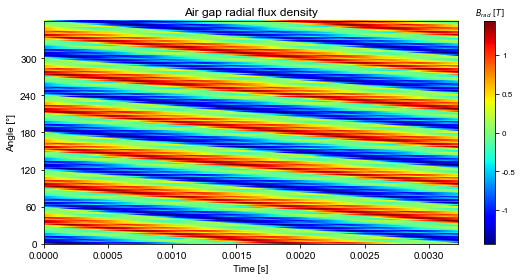

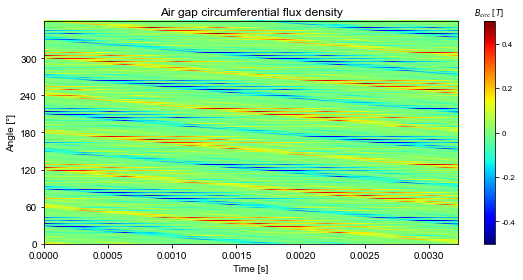

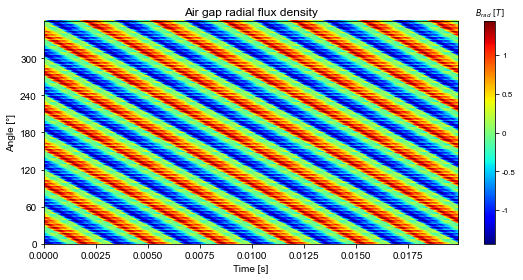

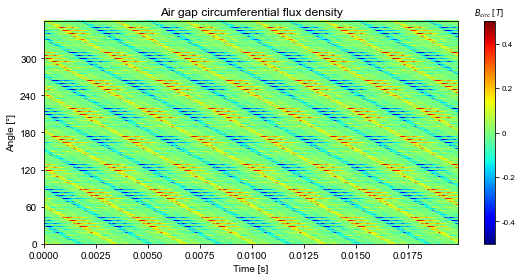

In [20]:
out_femm.mag.B.plot_3D_Data("time[smallestperiod]","angle{°}")
out_femm.mag.B.plot_3D_Data("time[oneperiod]","angle{°}")
out_femm.mag.B.plot_3D_Data("time","angle{°}")

In [12]:
# Tangential magnetic flux 
out_femm.mag.B.plot_2D_Data("angle","time[1]",component_list=["tangential"])
out_femm.mag.B.plot_2D_Data("wavenumber=[0,76]","time[1]",component_list=["tangential"])

The torque can be plotted with:

In [13]:
out_femm.mag.Tem.plot_2D_Data("time")

One can notice that the torque matrix includes the periodicity (only the meaningful part is stored)

In [14]:
print(out_femm.mag.Tem.values.shape)
print(simu_femm.input.Nt_tot)

(16,)
192


If the mesh was saved in the output object (mySimu.mag.is_get_meshsolution = True), it can be plotted with:

In [15]:
out_femm.mag.meshsolution.plot_contour(label="B", group_names="stator core")

<div>
<img src="https://www.pyleecan.org/_static/tuto_Simulation_FEMM_Bmesh.png" width="800"/>
</div>

Finally, it is possible to extend pyleecan by implementing new plot by using the results from output. For instance, the following plot requires plotly to display the radial flux density in the airgap over time and angle. 

In [ ]:
#%run -m pip install plotly # Uncomment this line to install plotly
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode 
init_notebook_mode() 

result = out_femm.mag.B.components["radial"].get_along("angle{°}", "time")
x = result["angle"]
y = result["time"]
z = result["B_r"]
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout( )
fig.update_layout(title='Radial flux density in the airgap over time and angle',
                  autosize=True,
                  scene = dict(
                      xaxis_title='Angle [°]',
                      yaxis_title='Time [s]',
                      zaxis_title='Flux [T]'
                  ),
                  width=700,
                  margin=dict(r=20, b=100, l=10, t=100),
                 )

fig.show(config = {"displaylogo":False})